In [2]:
import os
import sys
sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

/home/cjw/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [3]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmCompensatedTifs"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Ice.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_CCB.mm', '/media/cjw/Data/cyto/mmComp

dict_keys(['Fish4_Untreated.mm', 'Fish3_CCB.mm', 'Fish4_CCB.mm', 'Fish1_Untreated.mm', 'Fish2_ICE.mm', 'Fish2_CCB.mm', 'Fish5_CCB.mm', 'Fish1_Ice.mm', 'Fish6_CCB.mm', 'Fish3_Untreated.mm', 'Fish4_ICE.mm', 'Fish6_ICE.mm', 'Fish3_ICE.mm', 'Fish6_Untreated.mm', 'Fish2_Untreated.mm', 'Fish5_Untreated.mm', 'Fish1_CCB.mm', 'Fish5_ICE.mm'])

In [4]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


Encoder True
Tensor("Placeholder:0", shape=(?, 32, 32, 3), dtype=float32) (?, 32, 32, 3)
Tensor("latent_space/BiasAdd:0", shape=(?, 256), dtype=float32)
isize:  4 32
Tensor("Sigmoid:0", shape=(?, 32, 32, 3), dtype=float32)
180000 1406 128
179488 512
Epoch:  0 Iteration:  0 Loss:  432.25043 431.03812 1.2123191


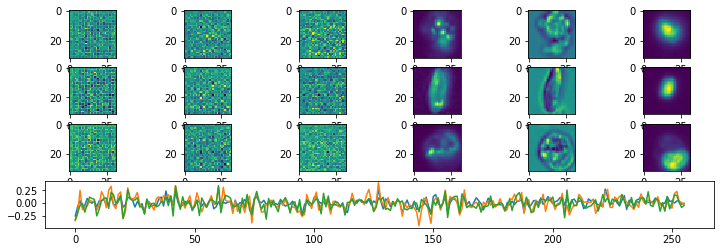

Epoch:  0 Iteration:  500 Loss:  17.49422 15.110662 2.3835588


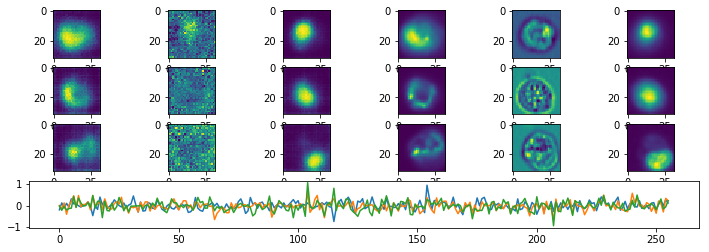

Epoch:  0 Iteration:  1000 Loss:  13.325696 11.881184 1.4445121


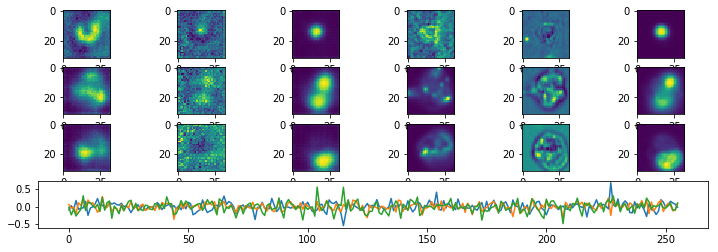

Epoch:  1 Iteration:  0 Loss:  11.869443 10.746325 1.1231182


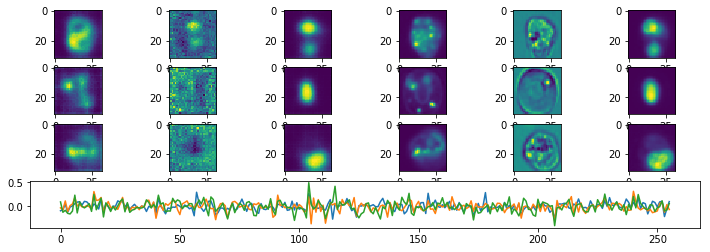

Epoch:  1 Iteration:  500 Loss:  9.660334 8.735552 0.9247823


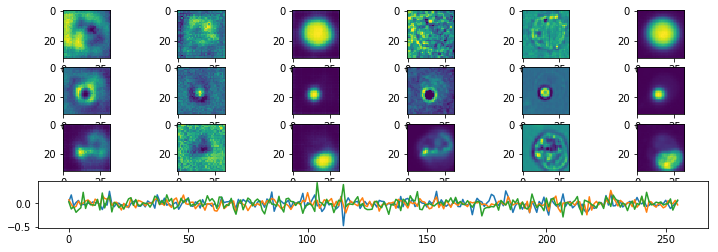

Epoch:  1 Iteration:  1000 Loss:  9.727525 8.921352 0.8061728


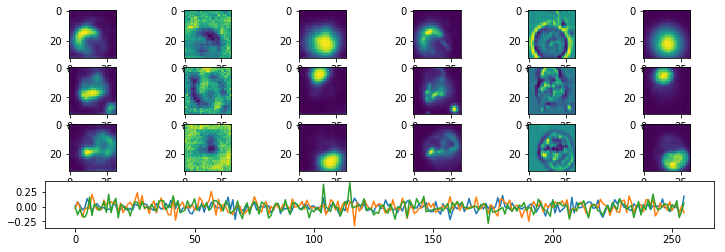

Epoch:  2 Iteration:  0 Loss:  8.234793 7.5091166 0.72567636


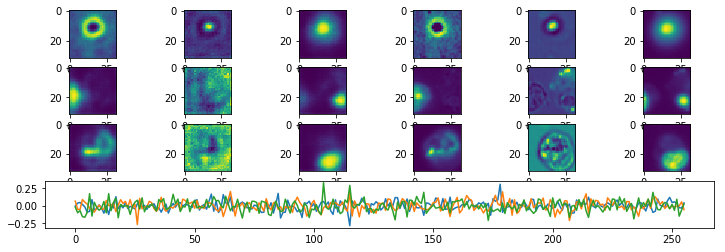

Epoch:  2 Iteration:  500 Loss:  8.376396 7.714923 0.6614733


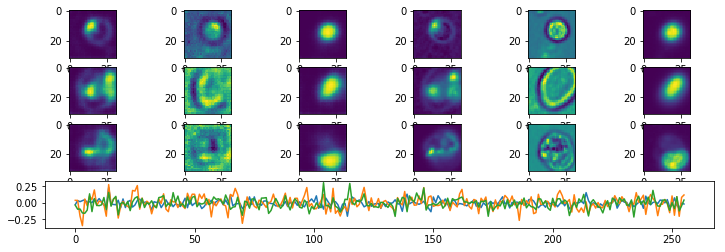

Epoch:  2 Iteration:  1000 Loss:  7.1760473 6.579056 0.5969918


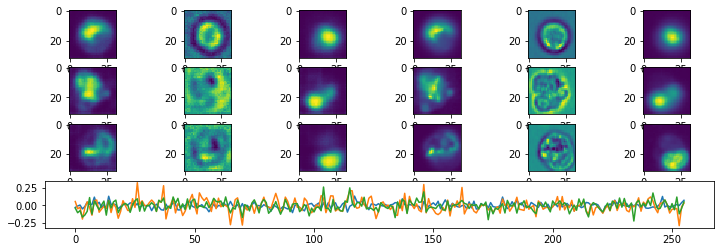

Epoch:  3 Iteration:  0 Loss:  7.701953 7.1305523 0.57140064


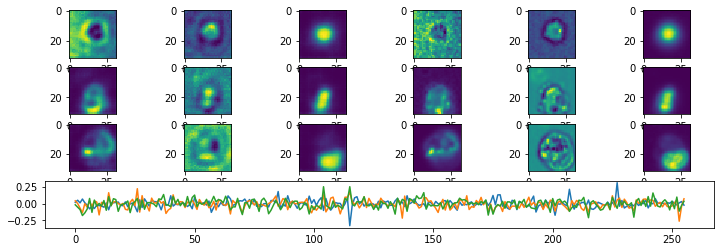

Epoch:  3 Iteration:  500 Loss:  7.548528 7.010416 0.53811204


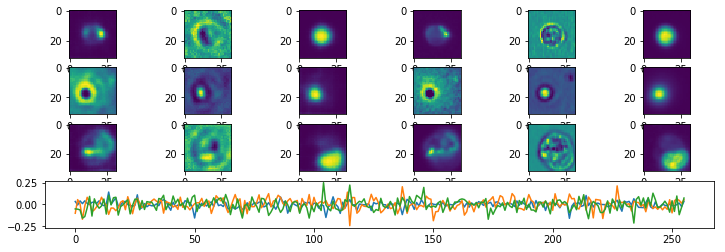

Epoch:  3 Iteration:  1000 Loss:  6.2200556 5.7180915 0.50196433


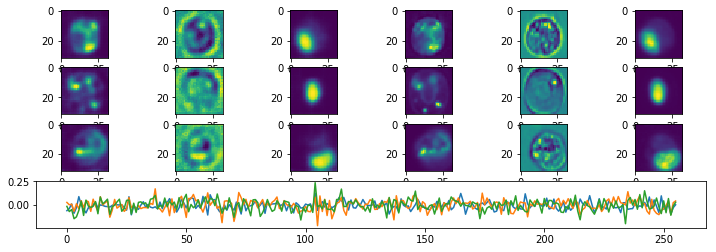

Epoch:  4 Iteration:  0 Loss:  6.2549644 5.772509 0.48245528


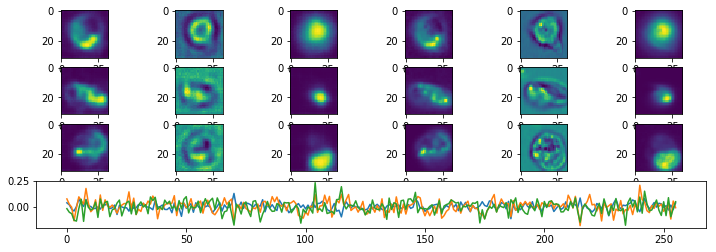

Epoch:  4 Iteration:  500 Loss:  6.377373 5.920903 0.45646983


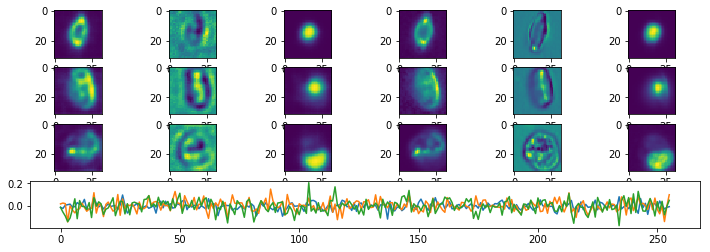

Epoch:  4 Iteration:  1000 Loss:  5.9522157 5.5093603 0.44285524


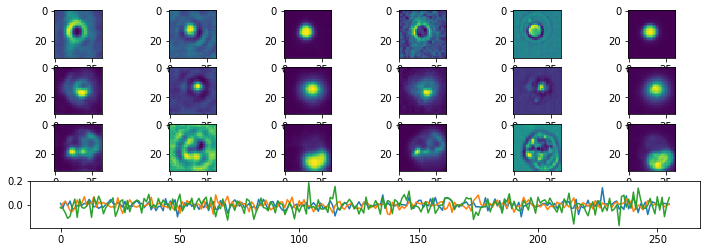

Epoch:  5 Iteration:  0 Loss:  5.050924 4.632414 0.41851002


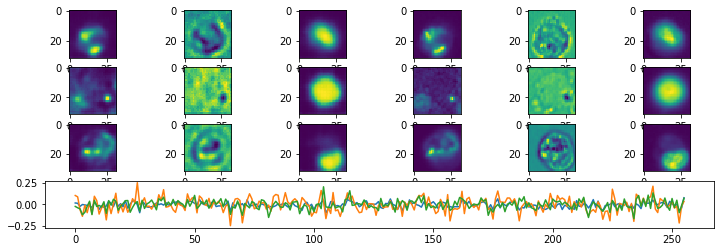

Epoch:  5 Iteration:  500 Loss:  4.9777946 4.5862503 0.39154428


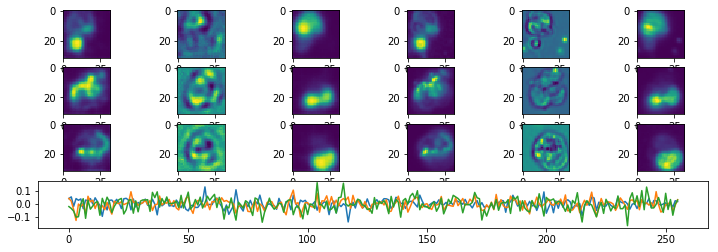

Epoch:  5 Iteration:  1000 Loss:  5.362193 4.9650154 0.39717755


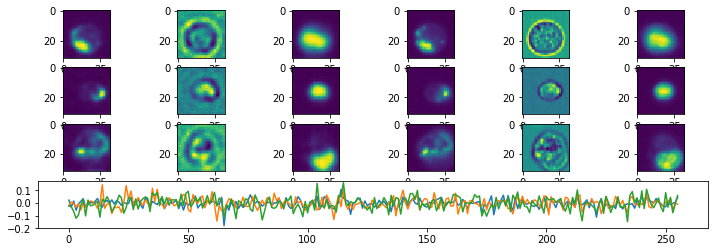

Epoch:  6 Iteration:  0 Loss:  4.5363564 4.1642833 0.37207308


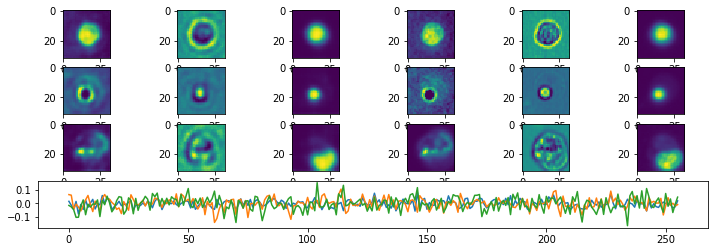

Epoch:  6 Iteration:  500 Loss:  4.463265 4.0941124 0.36915255


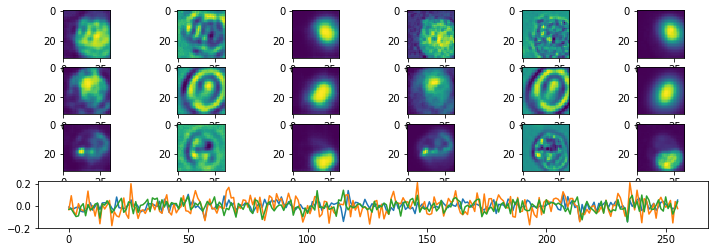

Epoch:  6 Iteration:  1000 Loss:  4.4574723 4.095028 0.36244437


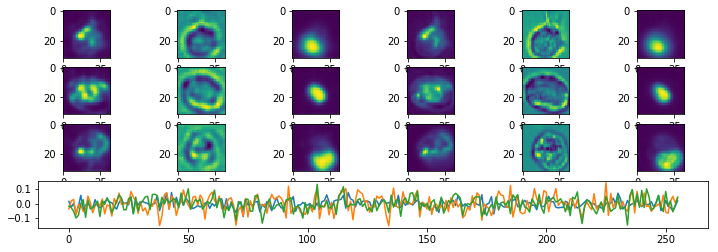

Epoch:  7 Iteration:  0 Loss:  4.4190593 4.067086 0.35197297


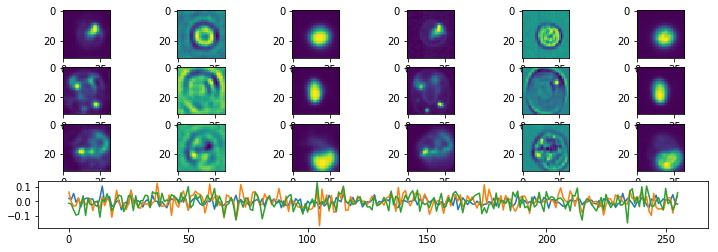

Epoch:  7 Iteration:  500 Loss:  4.6133494 4.2667284 0.34662092


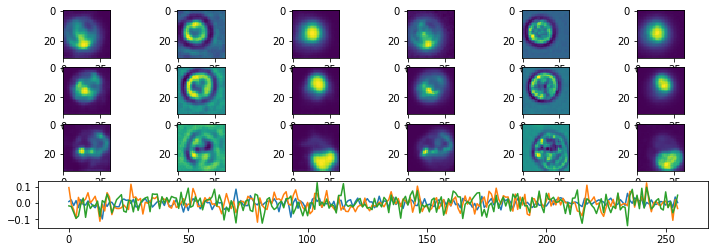

Epoch:  7 Iteration:  1000 Loss:  4.0386972 3.712668 0.32602906


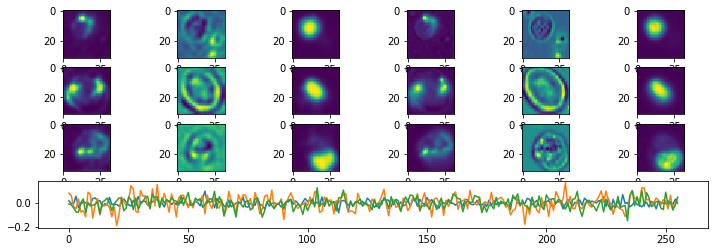

Epoch:  8 Iteration:  0 Loss:  3.855213 3.5359893 0.3192236


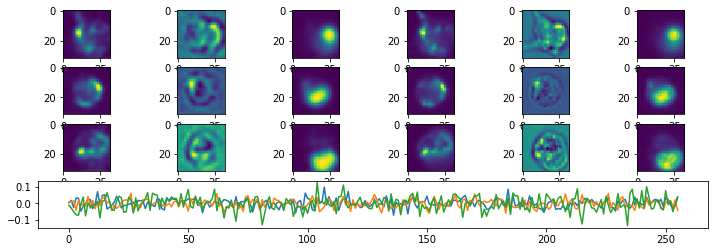

Epoch:  8 Iteration:  500 Loss:  4.3477983 4.0254607 0.32233748


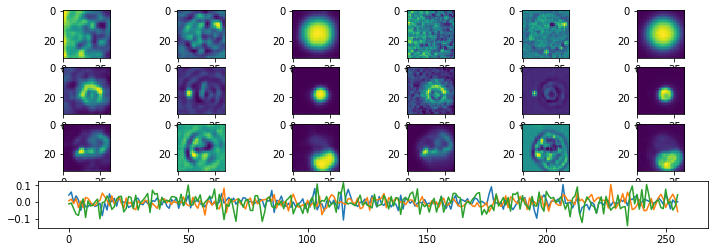

Epoch:  8 Iteration:  1000 Loss:  4.118141 3.8050387 0.31310236


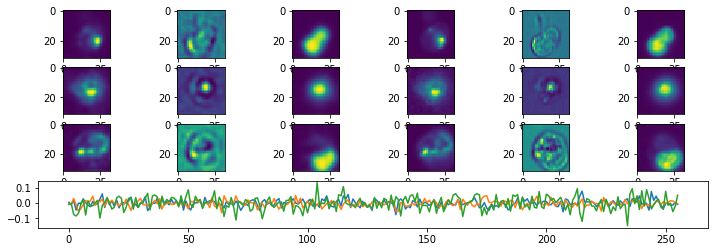

Epoch:  9 Iteration:  0 Loss:  4.0347924 3.7226114 0.31218112


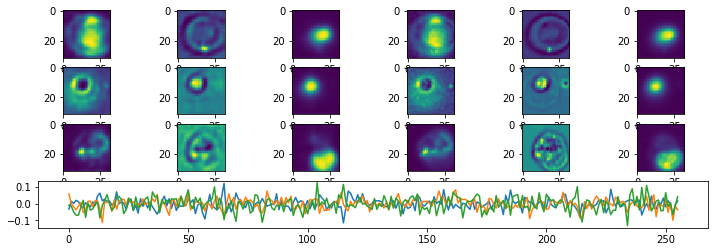

Epoch:  9 Iteration:  500 Loss:  3.526514 3.227896 0.2986181


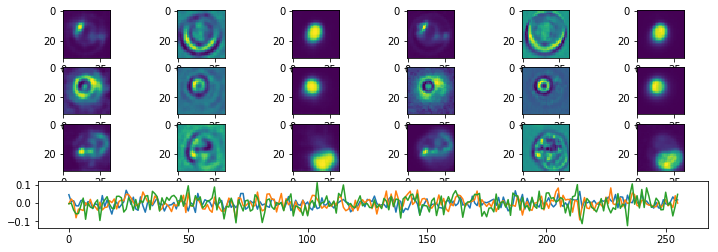

Epoch:  9 Iteration:  1000 Loss:  3.636292 3.3422892 0.29400277


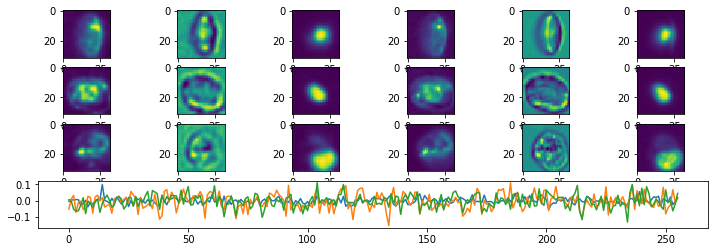

Epoch:  10 Iteration:  0 Loss:  3.7207532 3.4336758 0.2870774


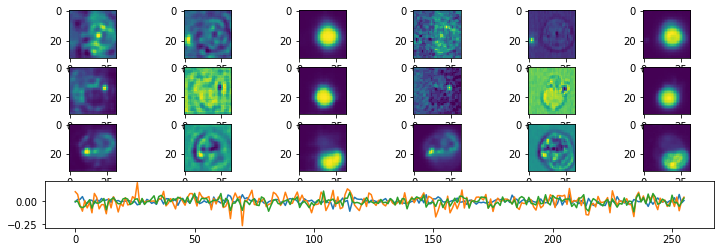

Epoch:  10 Iteration:  500 Loss:  3.7303665 3.440566 0.28980032


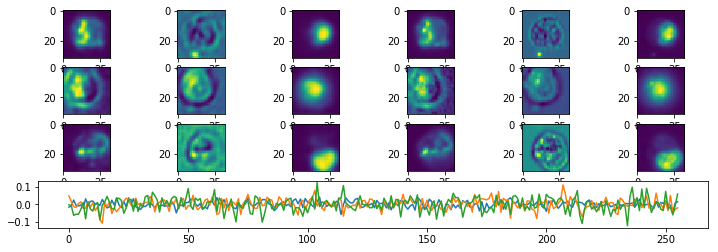

Epoch:  10 Iteration:  1000 Loss:  3.488833 3.2131734 0.27565962


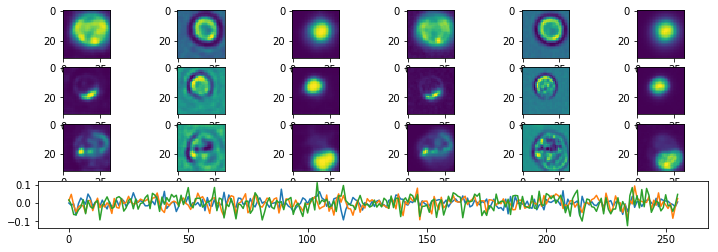

Epoch:  11 Iteration:  0 Loss:  3.4353588 3.1571403 0.27821857


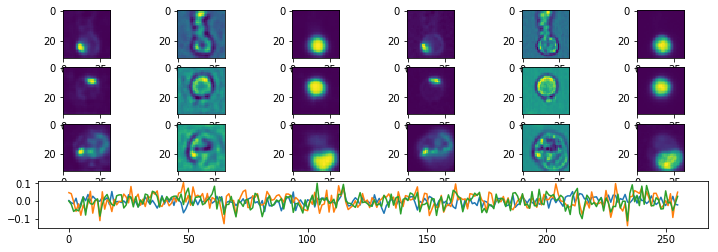

Epoch:  11 Iteration:  500 Loss:  3.773316 3.5059626 0.2673533


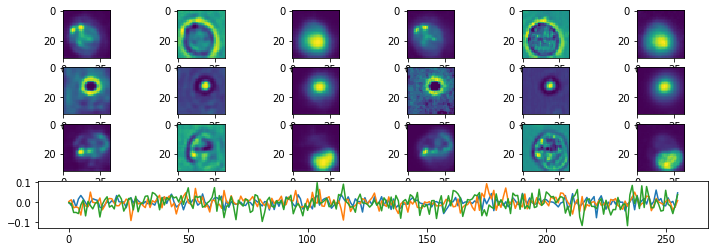

Epoch:  11 Iteration:  1000 Loss:  3.3472414 3.08361 0.2636313


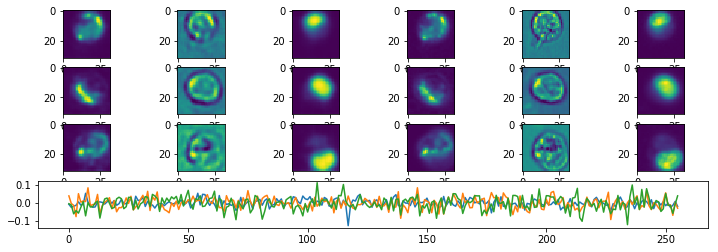

Epoch:  12 Iteration:  0 Loss:  3.3287172 3.0655425 0.26317483


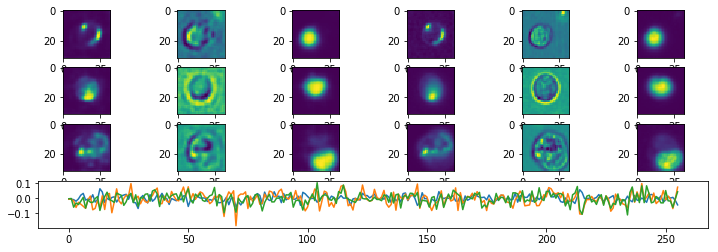

Epoch:  12 Iteration:  500 Loss:  3.1291146 2.8727717 0.25634292


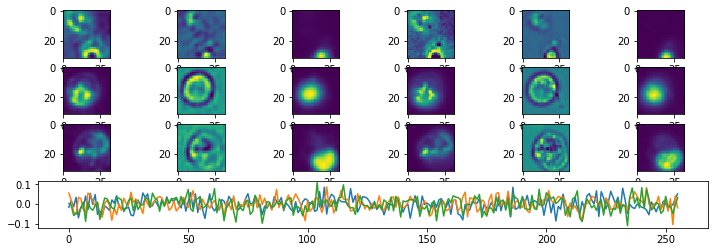

Epoch:  12 Iteration:  1000 Loss:  3.0874956 2.8365355 0.25096005


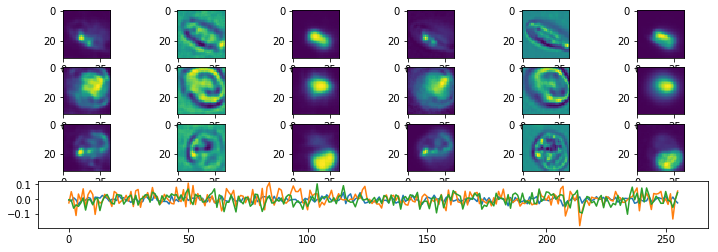

Epoch:  13 Iteration:  0 Loss:  2.8650696 2.6234093 0.24166045


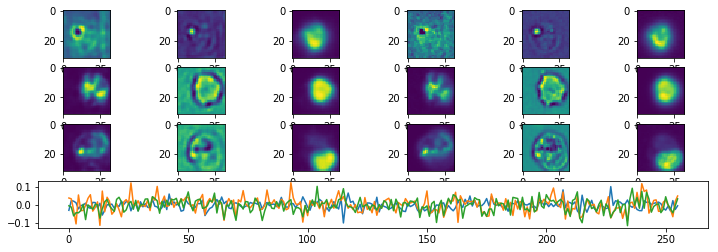

Epoch:  13 Iteration:  500 Loss:  3.6138182 3.3728216 0.24099657


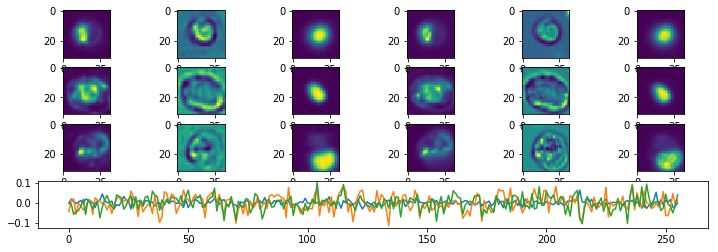

Epoch:  13 Iteration:  1000 Loss:  3.1958833 2.9574187 0.23846455


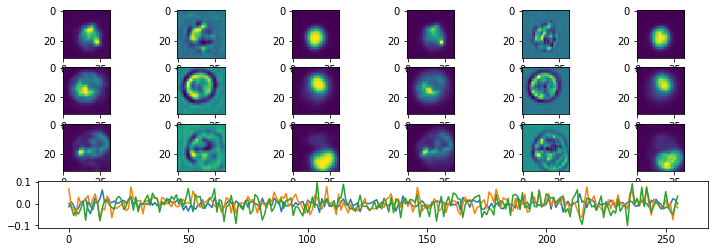

Epoch:  14 Iteration:  0 Loss:  3.3889039 3.149882 0.23902181


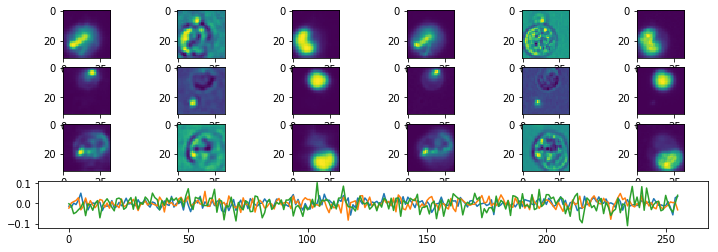

Epoch:  14 Iteration:  500 Loss:  3.0556986 2.8247433 0.23095542


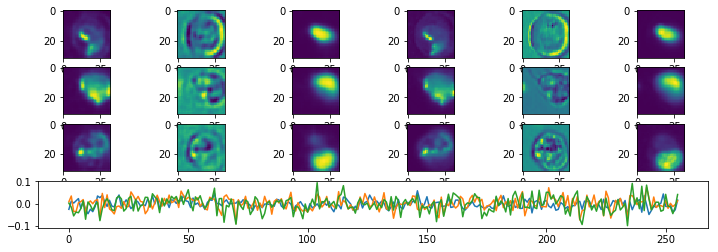

Epoch:  14 Iteration:  1000 Loss:  3.0132213 2.7858973 0.22732407


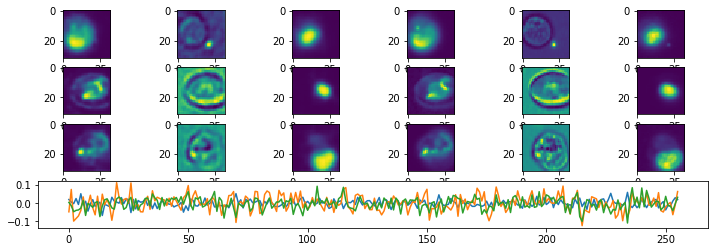

Epoch:  15 Iteration:  0 Loss:  3.0922556 2.8668265 0.22542912


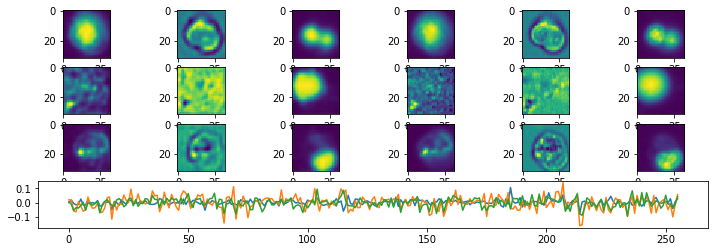

Epoch:  15 Iteration:  500 Loss:  3.317513 3.0908394 0.22667348


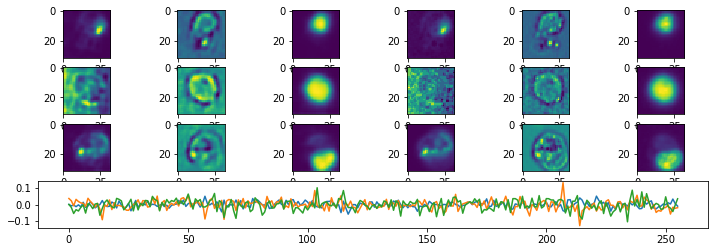

Epoch:  15 Iteration:  1000 Loss:  2.9428458 2.7198944 0.22295132


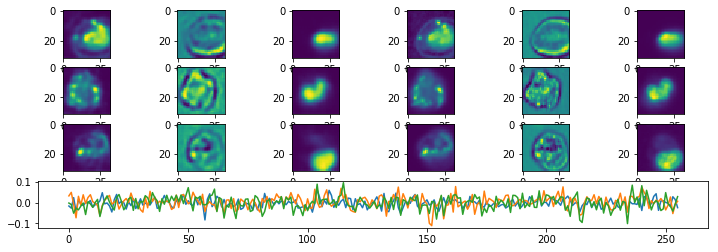

Epoch:  16 Iteration:  0 Loss:  2.841464 2.6226985 0.21876556


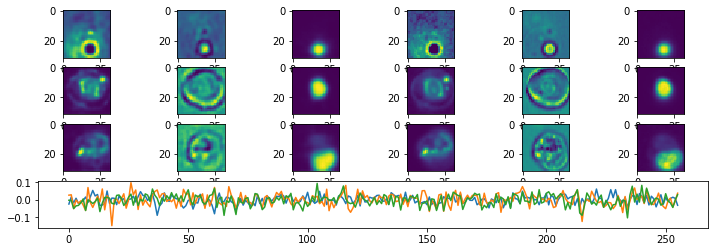

Epoch:  16 Iteration:  500 Loss:  3.1326768 2.9105494 0.22212748


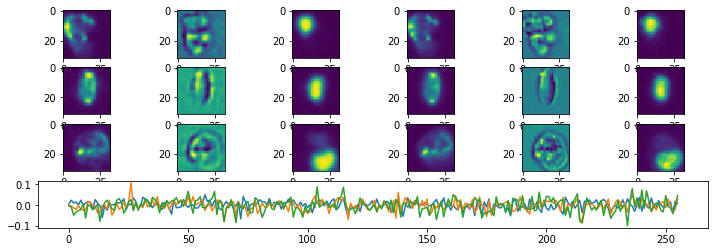

Epoch:  16 Iteration:  1000 Loss:  2.946955 2.7349417 0.21201321


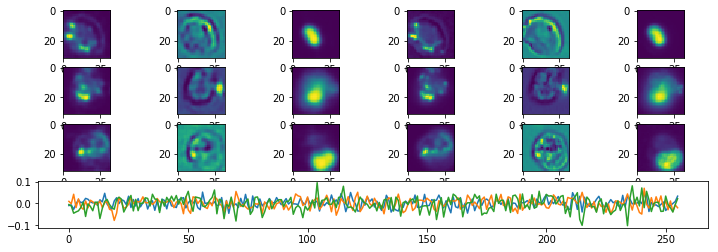

Epoch:  17 Iteration:  0 Loss:  3.085086 2.8728726 0.21221355


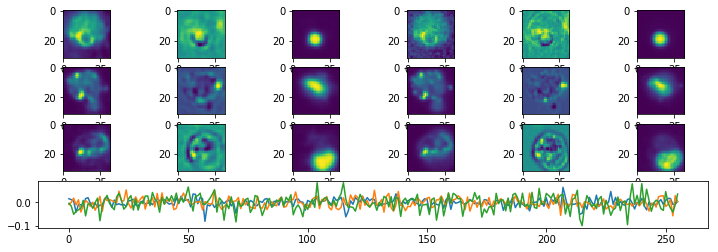

Epoch:  17 Iteration:  500 Loss:  2.611276 2.4020095 0.20926635


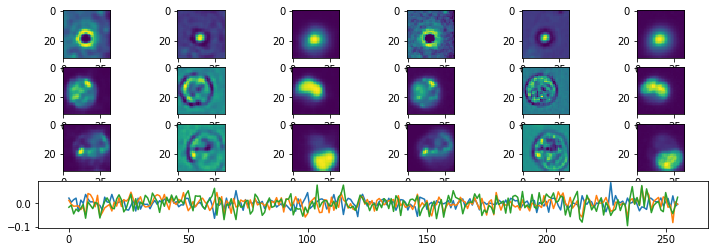

Epoch:  17 Iteration:  1000 Loss:  2.605818 2.4022436 0.20357434


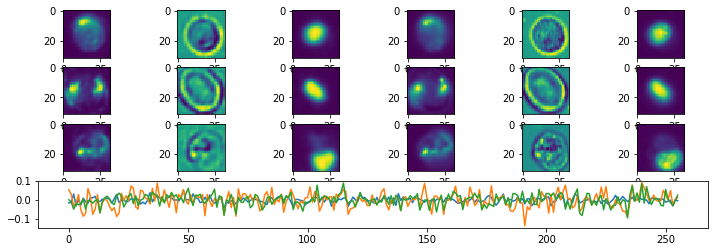

Epoch:  18 Iteration:  0 Loss:  3.0222175 2.812848 0.20936951


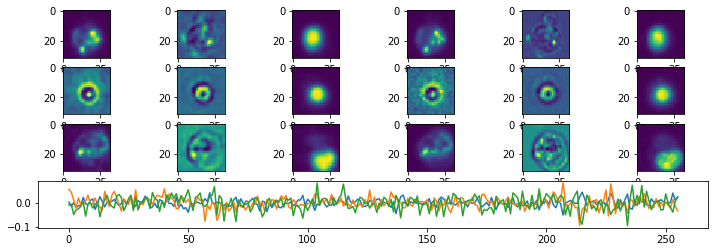

Epoch:  18 Iteration:  500 Loss:  2.779909 2.585688 0.19422074


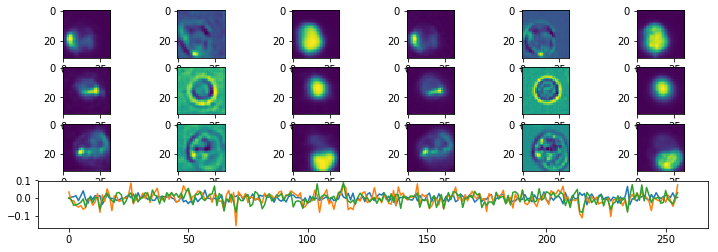

Epoch:  18 Iteration:  1000 Loss:  3.105165 2.9036593 0.20150554


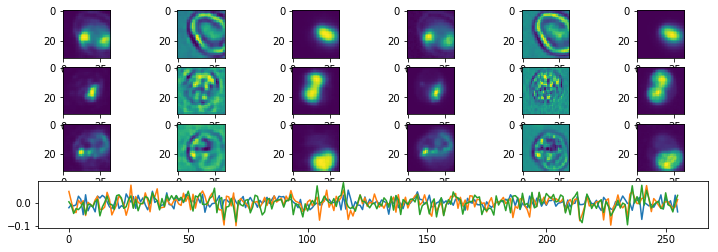

Epoch:  19 Iteration:  0 Loss:  2.898725 2.699645 0.1990801


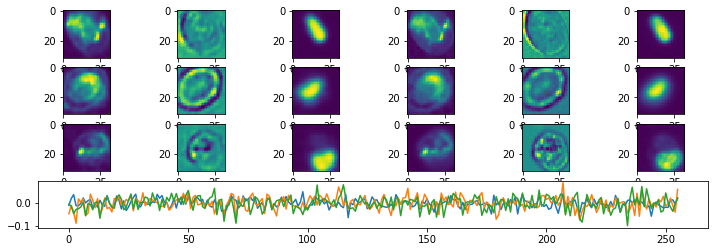

Epoch:  19 Iteration:  500 Loss:  2.798689 2.5283816 0.27030727


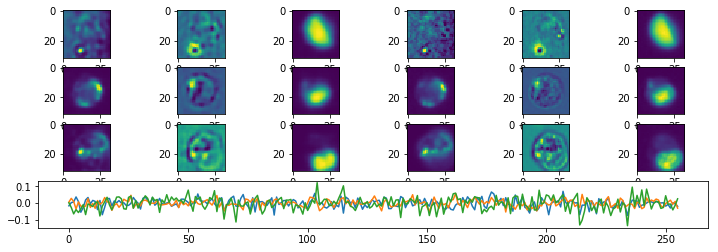

Epoch:  19 Iteration:  1000 Loss:  2.7821064 2.5456867 0.23641962


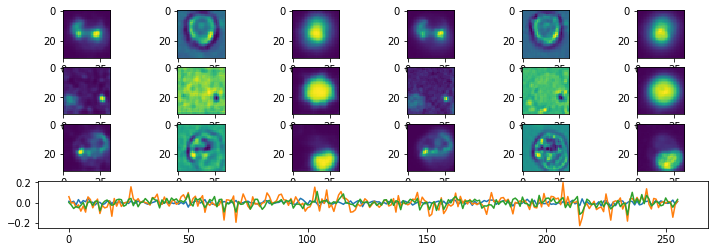

Epoch:  20 Iteration:  0 Loss:  2.6842735 2.4599326 0.22434102


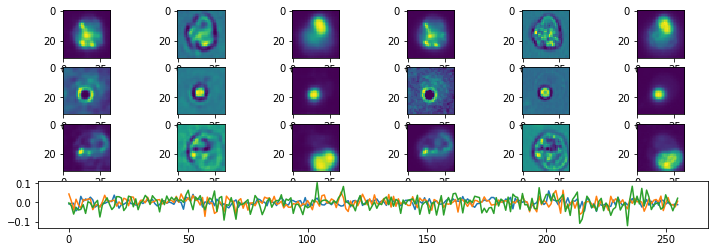

Epoch:  20 Iteration:  500 Loss:  2.8891582 2.6756697 0.21348865


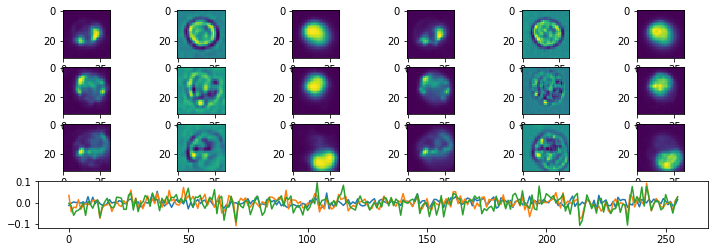

Epoch:  20 Iteration:  1000 Loss:  2.6655757 2.4573703 0.20820555


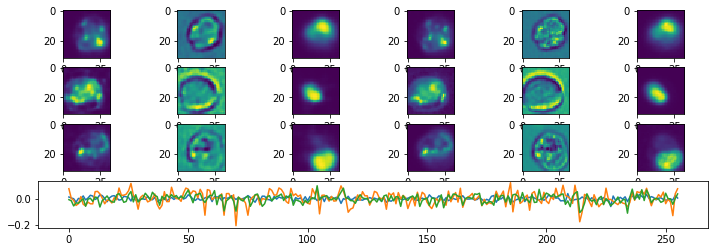

Epoch:  21 Iteration:  0 Loss:  2.4333313 2.2312646 0.20206659


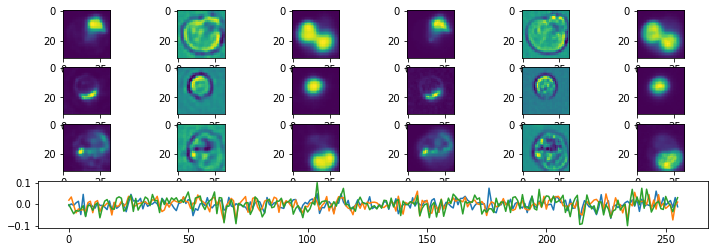

Epoch:  21 Iteration:  500 Loss:  3.0176086 2.8115797 0.20602894


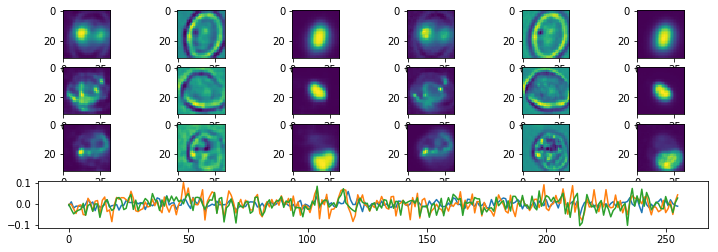

Epoch:  21 Iteration:  1000 Loss:  2.8840055 2.6854322 0.19857337


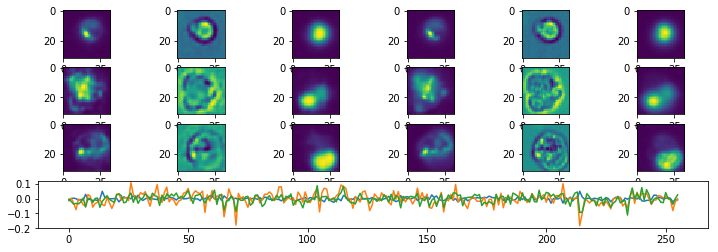

Epoch:  22 Iteration:  0 Loss:  2.4782574 2.2796469 0.19861047


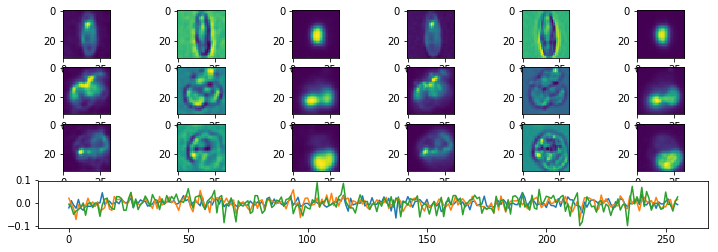

Epoch:  22 Iteration:  500 Loss:  2.768795 2.5727863 0.19600868


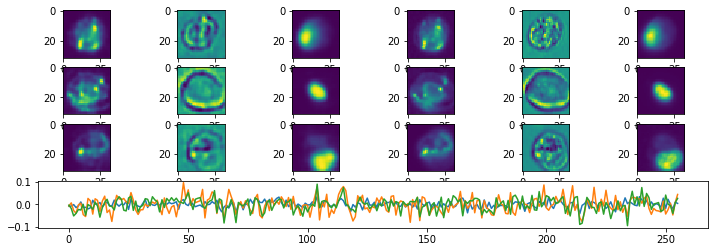

Epoch:  22 Iteration:  1000 Loss:  3.131613 2.9364753 0.1951378


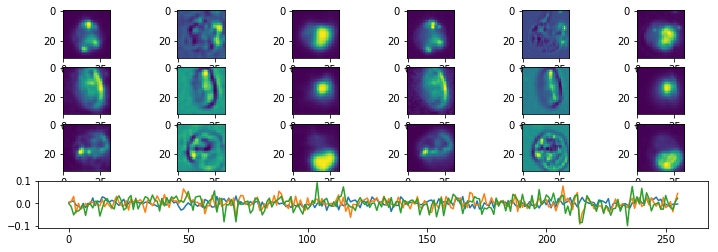

Epoch:  23 Iteration:  0 Loss:  2.6772244 2.4952765 0.18194804


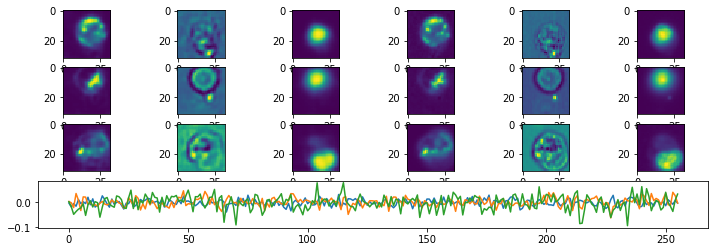

Epoch:  23 Iteration:  500 Loss:  2.5185263 2.34064 0.17788623


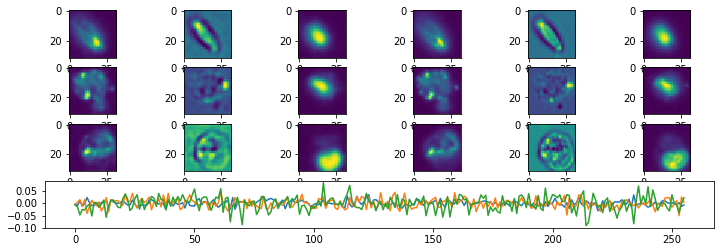

Epoch:  23 Iteration:  1000 Loss:  2.7031183 2.522327 0.18079133


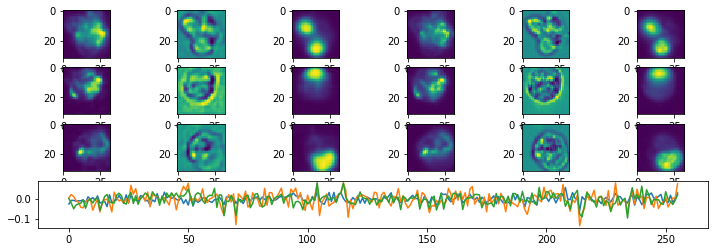

Epoch:  24 Iteration:  0 Loss:  2.519825 2.3426328 0.17719215


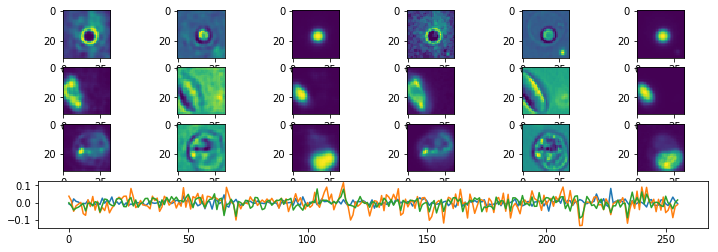

Epoch:  24 Iteration:  500 Loss:  2.7392612 2.5645156 0.17474563


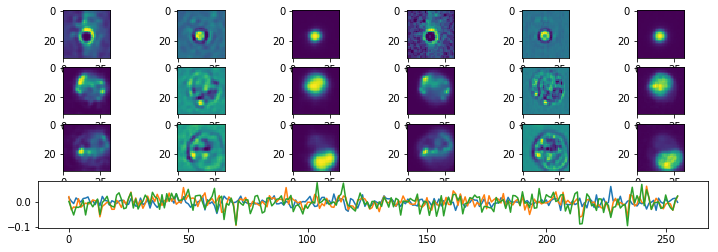

Epoch:  24 Iteration:  1000 Loss:  2.4542625 2.279159 0.17510352


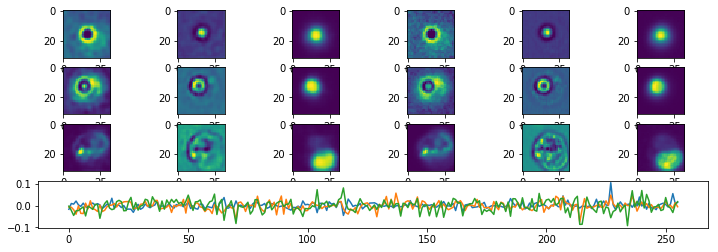

Epoch:  25 Iteration:  0 Loss:  2.5014305 2.333132 0.16829838


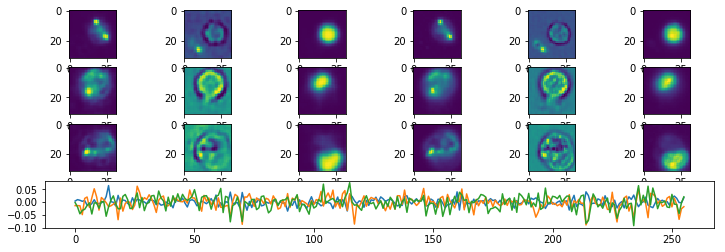

Epoch:  25 Iteration:  500 Loss:  2.7434027 2.5677166 0.17568608


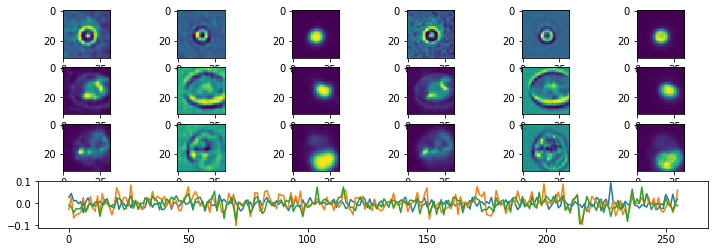

Epoch:  25 Iteration:  1000 Loss:  2.5703793 2.4006178 0.16976136


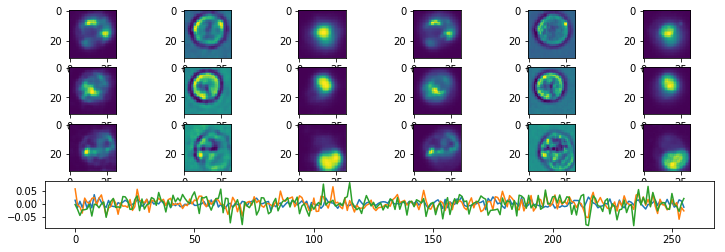

Epoch:  26 Iteration:  0 Loss:  2.59257 2.4201243 0.17244571


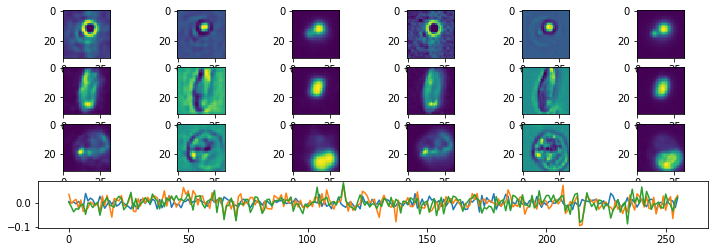

Epoch:  26 Iteration:  500 Loss:  2.4992938 2.3324986 0.16679515


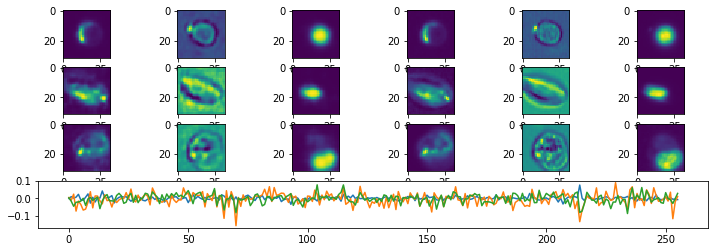

Epoch:  26 Iteration:  1000 Loss:  2.7164829 2.5501878 0.16629499


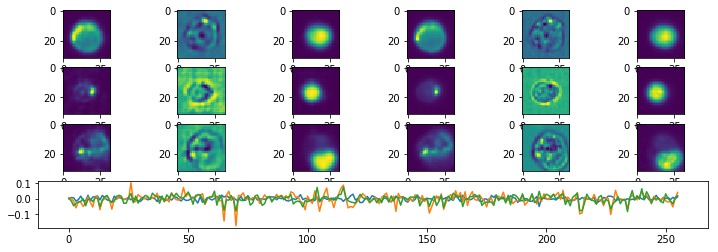

Epoch:  27 Iteration:  0 Loss:  2.7508485 2.5878947 0.16295375


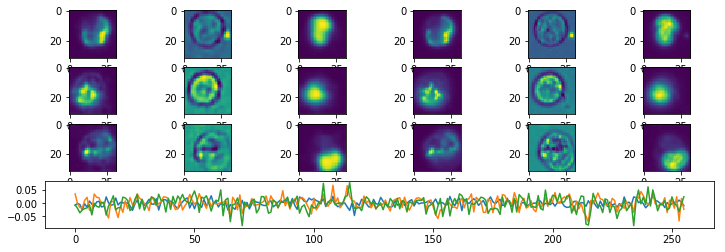

Epoch:  27 Iteration:  500 Loss:  3.106155 2.8471932 0.25896156


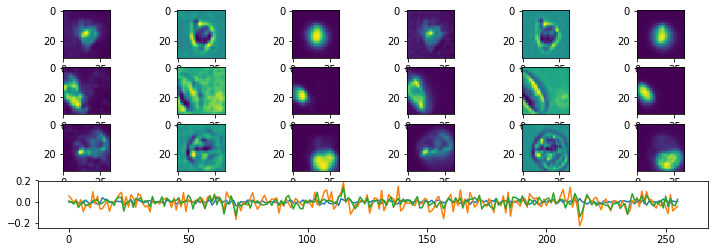

Epoch:  27 Iteration:  1000 Loss:  2.7007298 2.4735792 0.22715059


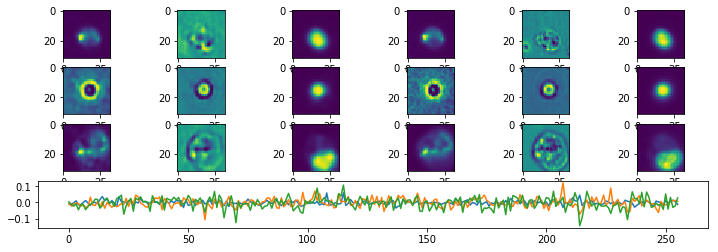

Epoch:  28 Iteration:  0 Loss:  2.5457263 2.3382502 0.2074761


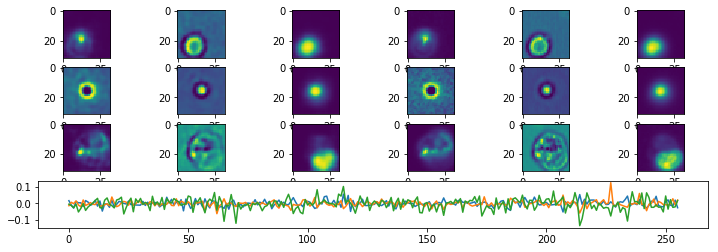

Epoch:  28 Iteration:  500 Loss:  2.4351146 2.2452316 0.18988307


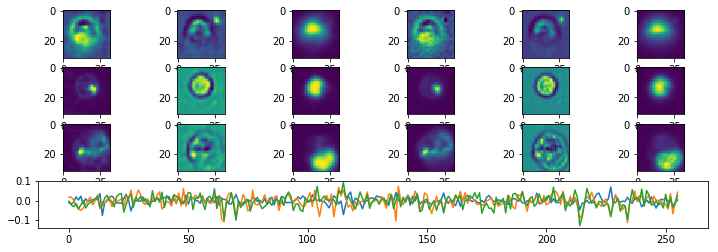

Epoch:  28 Iteration:  1000 Loss:  2.5876749 2.4030623 0.18461259


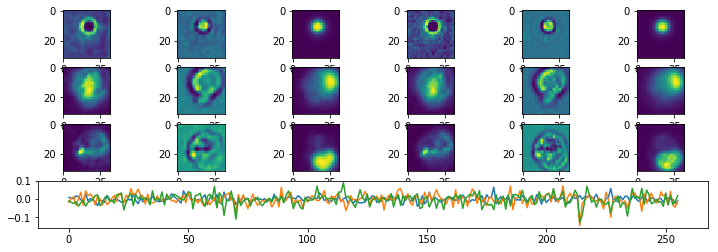

Epoch:  29 Iteration:  0 Loss:  2.755794 2.5720305 0.1837634


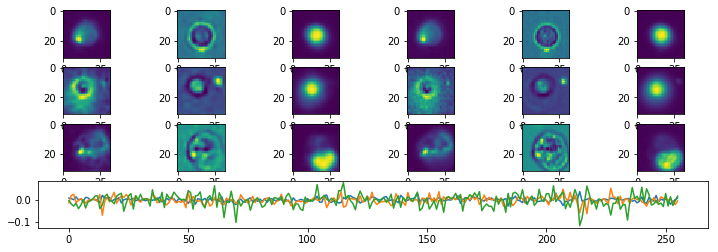

Epoch:  29 Iteration:  500 Loss:  2.3858206 2.2110376 0.17478302


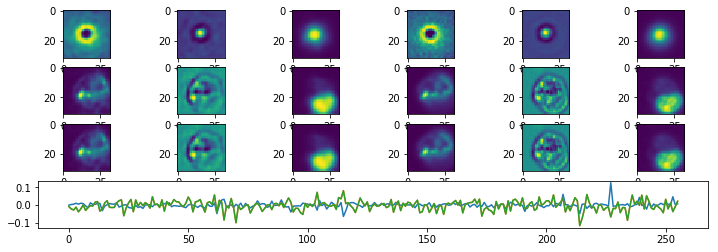

Epoch:  29 Iteration:  1000 Loss:  2.4016116 2.2292519 0.17235975


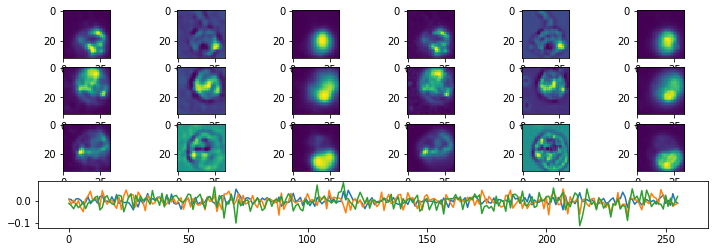

Epoch:  30 Iteration:  0 Loss:  2.5027008 2.3303223 0.17237845


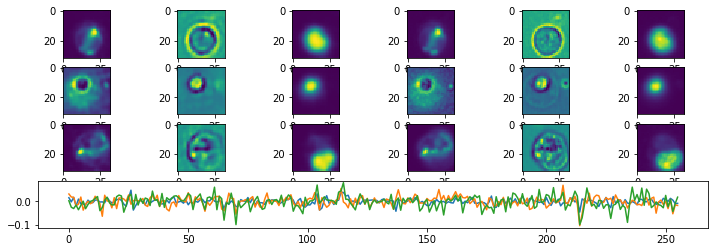

Epoch:  30 Iteration:  500 Loss:  2.5269837 2.3602002 0.1667835


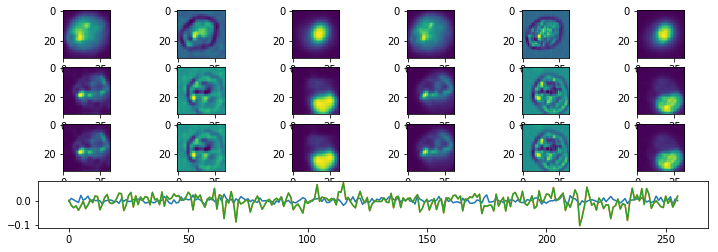

Epoch:  30 Iteration:  1000 Loss:  2.6417196 2.4725006 0.16921909


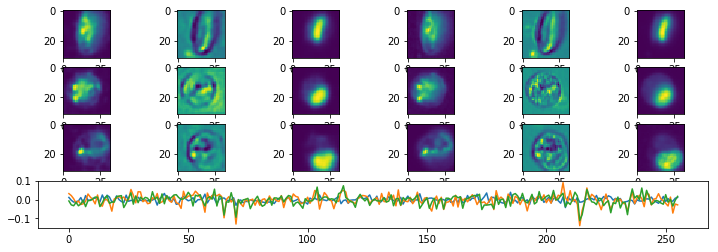

Epoch:  31 Iteration:  0 Loss:  2.4088218 2.241507 0.1673147


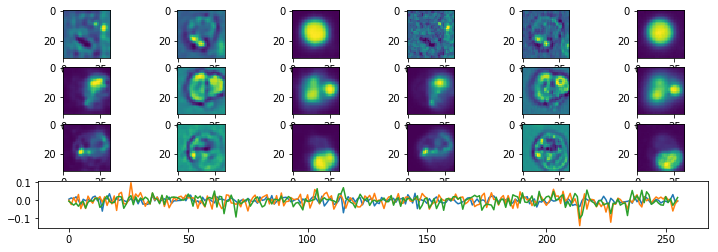

Epoch:  31 Iteration:  500 Loss:  2.5061862 2.3420758 0.16411036


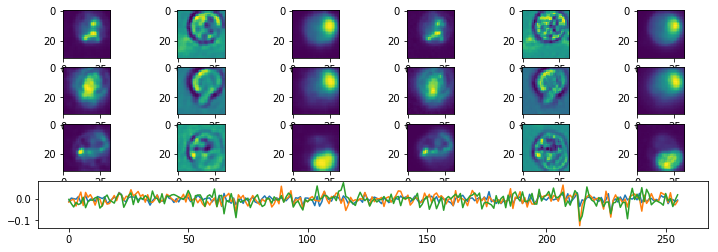

Epoch:  31 Iteration:  1000 Loss:  3.056082 2.885231 0.17085096


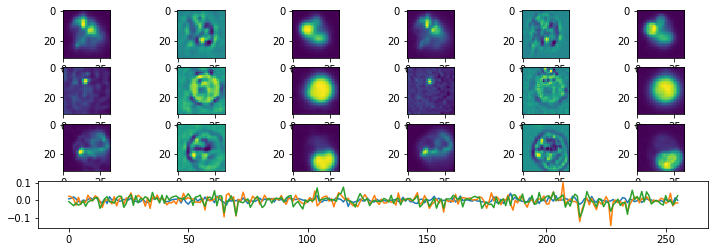

Epoch:  32 Iteration:  0 Loss:  2.3295264 2.1722908 0.15723567


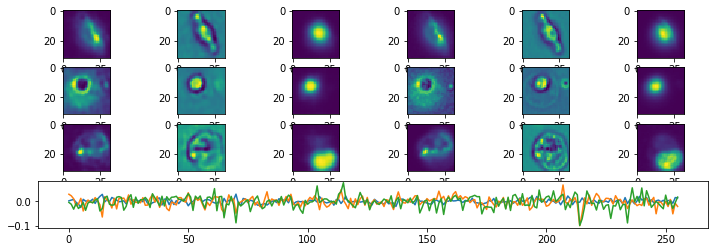

Epoch:  32 Iteration:  500 Loss:  2.2690494 2.117253 0.15179637


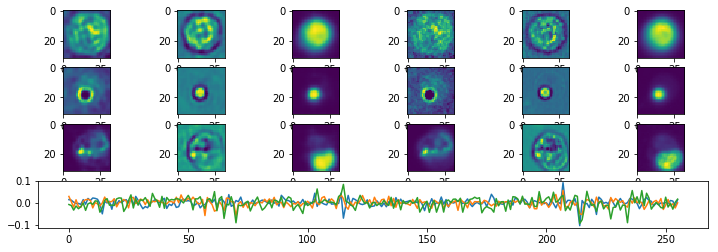

Epoch:  32 Iteration:  1000 Loss:  2.2547247 2.1017373 0.15298744


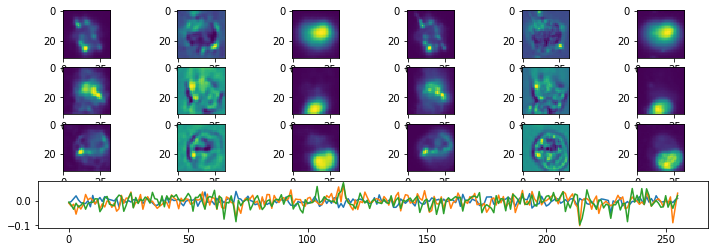

Epoch:  33 Iteration:  0 Loss:  2.4578004 2.301085 0.15671536


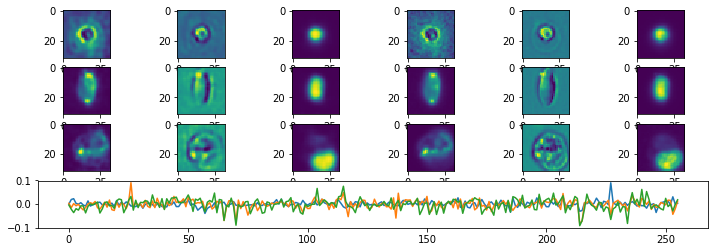

Epoch:  33 Iteration:  500 Loss:  2.5963383 2.4428694 0.15346888


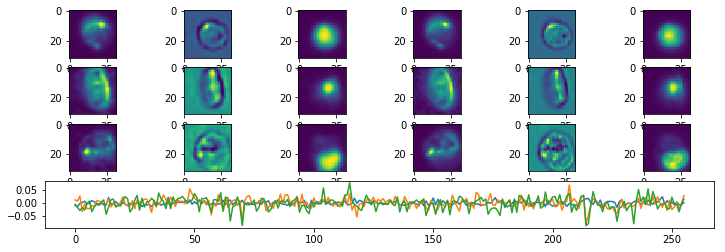

Epoch:  33 Iteration:  1000 Loss:  2.5556715 2.4029093 0.15276209


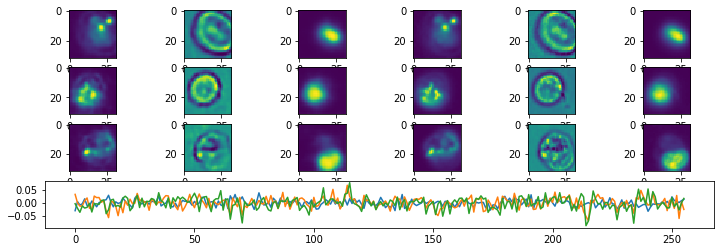

Epoch:  34 Iteration:  0 Loss:  2.6951187 2.5403523 0.15476635


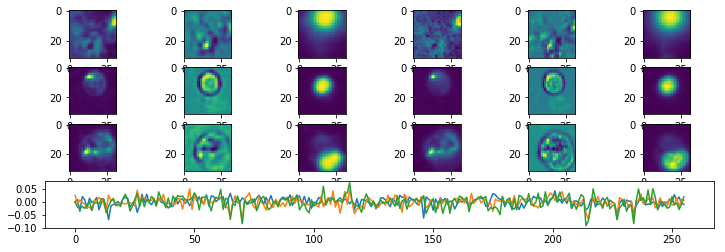

Epoch:  34 Iteration:  500 Loss:  2.55954 2.3560486 0.20349151


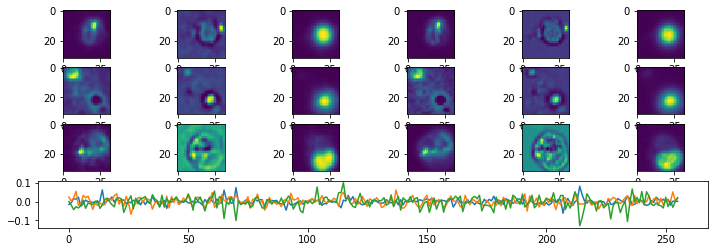

Epoch:  34 Iteration:  1000 Loss:  2.4436467 2.2645473 0.1790993


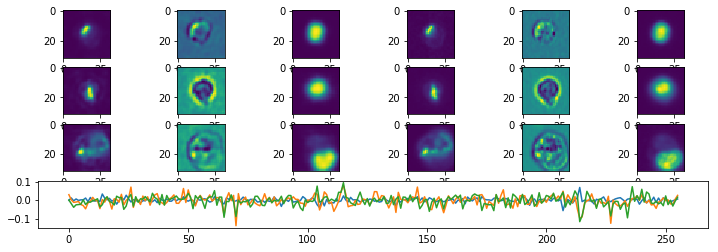

Epoch:  35 Iteration:  0 Loss:  2.4587293 2.2857244 0.17300484


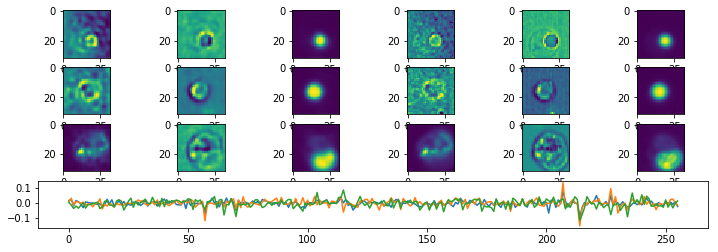

Epoch:  35 Iteration:  500 Loss:  2.4782138 2.3098845 0.16832913


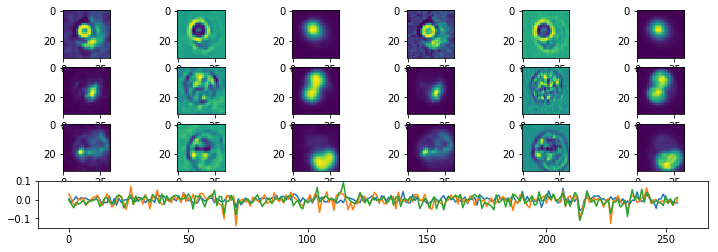

Epoch:  35 Iteration:  1000 Loss:  2.2058923 2.0448098 0.16108242


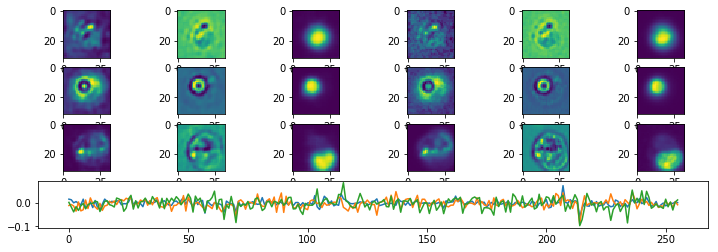

Epoch:  36 Iteration:  0 Loss:  2.3492508 2.193369 0.15588196


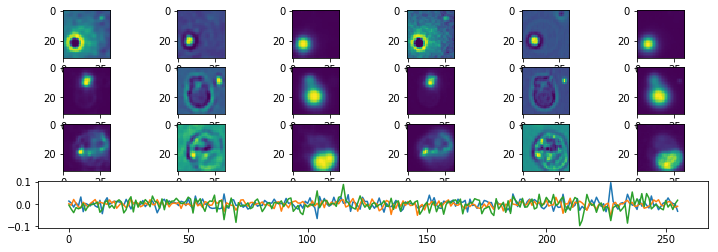

Epoch:  36 Iteration:  500 Loss:  2.420233 2.2648768 0.1553562


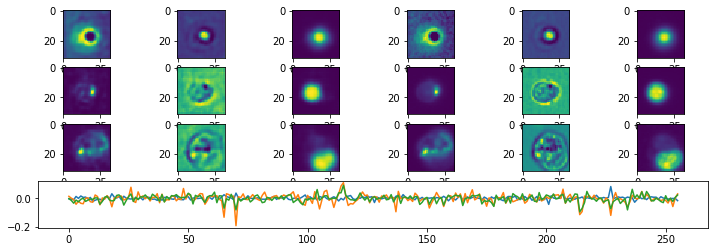

Epoch:  36 Iteration:  1000 Loss:  2.5102596 2.358768 0.1514917


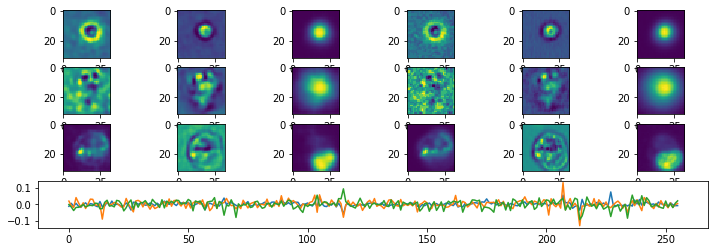

Epoch:  37 Iteration:  0 Loss:  2.6674795 2.514033 0.15344633


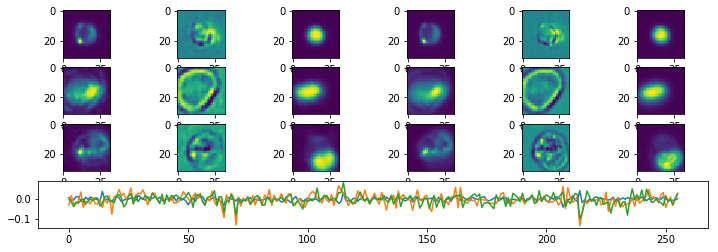

Epoch:  37 Iteration:  500 Loss:  2.1718361 2.024744 0.14709201


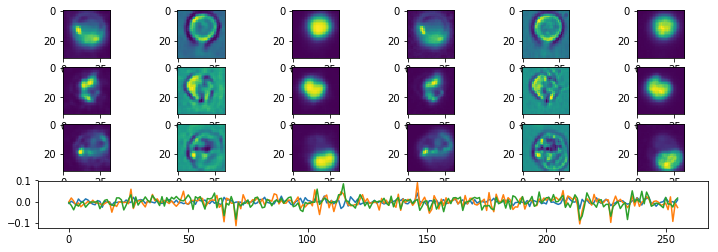

Epoch:  37 Iteration:  1000 Loss:  2.5555804 2.4098103 0.14577015


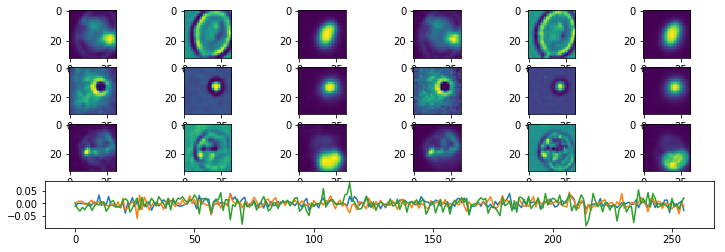

Epoch:  38 Iteration:  0 Loss:  2.29016 2.1452081 0.14495179


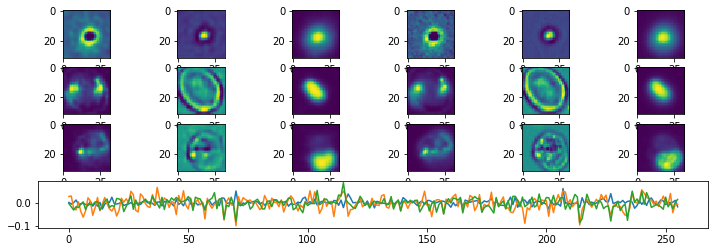

Epoch:  38 Iteration:  500 Loss:  2.3451667 2.1966314 0.14853516


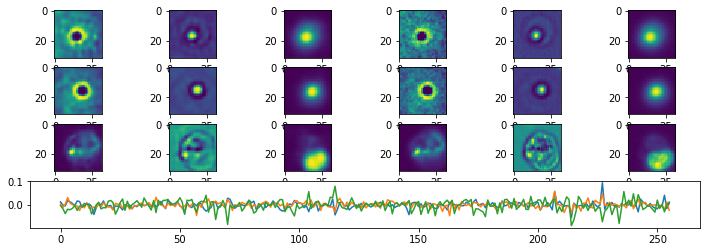

Epoch:  38 Iteration:  1000 Loss:  2.1719422 2.0302274 0.14171472


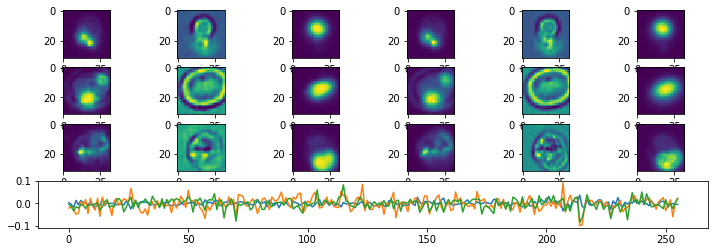

Epoch:  39 Iteration:  0 Loss:  2.3581731 2.2194917 0.13868135


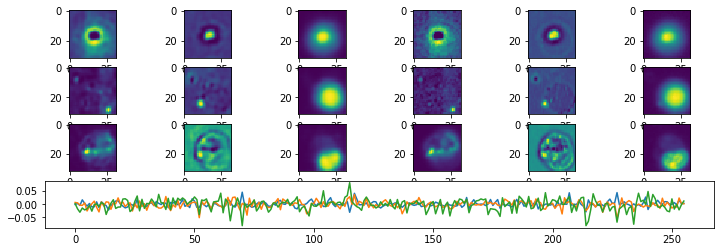

Epoch:  39 Iteration:  500 Loss:  2.1083996 1.9669151 0.14148451


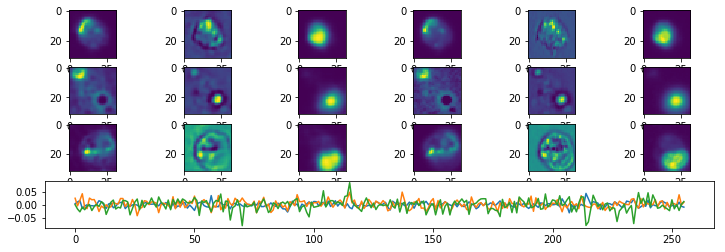

Epoch:  39 Iteration:  1000 Loss:  2.3167639 2.1785438 0.13821998


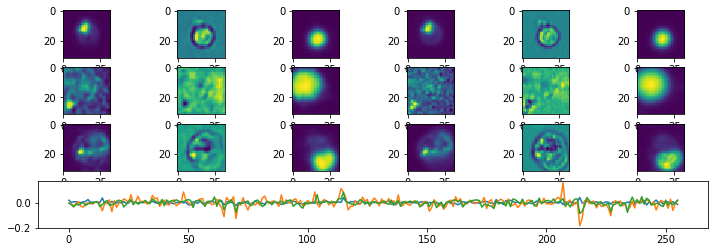

Done


In [6]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 3
p_channels = [1,3,4]
p_nepochs = 40
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 256 #128 + 64
p_droprate = 0.95
p_stdev = .04
p_slam = .0005
p_denoise = None
enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev
params['slam'] = p_slam
params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes
params['denoise'] = p_denoise
cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-11-09-0"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [5]:
x = 4
x

4